In [1]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.tree import DecisionTreeClassifier, plot_tree
from sklearn.metrics import accuracy_score, confusion_matrix
from sklearn.ensemble import BaggingClassifier, RandomForestClassifier, AdaBoostClassifier
from sklearn.svm import SVC
from xgboost import XGBClassifier
from sklearn.model_selection import train_test_split

# Load the datasets
train_data = pd.read_csv('C:/Users/user/Downloads/Classification & Regression Project/pendigits-train.csv')
test_data = pd.read_csv('C:/Users/user/Downloads/Classification & Regression Project/pendigits-test.csv')

In [3]:
train_data.head()

,47,100,27,81,57,37,26,0,0.1,23,56,53,100.1,90,40,98,8
0,0,89,27,100,42,75,29,45,15,15,37,0,69,2,100,6,2
1,0,57,31,68,72,90,100,100,76,75,50,51,28,25,16,0,1
2,0,100,7,92,5,68,19,45,86,34,100,45,74,23,67,0,4
3,0,67,49,83,100,100,81,80,60,60,40,40,33,20,47,0,1
4,100,100,88,99,49,74,17,47,0,16,37,0,73,16,20,20,6


In [5]:
test_data.head()

,88,92,2,99,16,66,94,37,70,0,0.1,24,42,65,100,100.1,8
0,80,100,18,98,60,66,100,29,42,0,0,23,42,61,56,98,8
1,0,94,9,57,20,19,7,0,20,36,70,68,100,100,18,92,8
2,95,82,71,100,27,77,77,73,100,80,93,42,56,13,0,0,9
3,68,100,6,88,47,75,87,82,85,56,100,29,75,6,0,0,9
4,70,100,100,97,70,81,45,65,30,49,20,33,0,16,0,0,1


In [7]:
import warnings
warnings.filterwarnings("ignore") 

# Rename columns 
train_data.columns = [f'feature_{i}' for i in range(train_data.shape[1] - 1)] + ['class']
test_data.columns = [f'feature_{i}' for i in range(test_data.shape[1] - 1)] + ['class']

# Separate features and label (class) 
x_train = train_data.drop(columns=['class'])
y_train = train_data['class']
x_test = test_data.drop(columns=['class'])
y_test = test_data['class']

# 1- Generate a scatterplot matrix to show the relationships between the variables and a heatmap to determine correlated attributes, then write a summary of what you noticed.

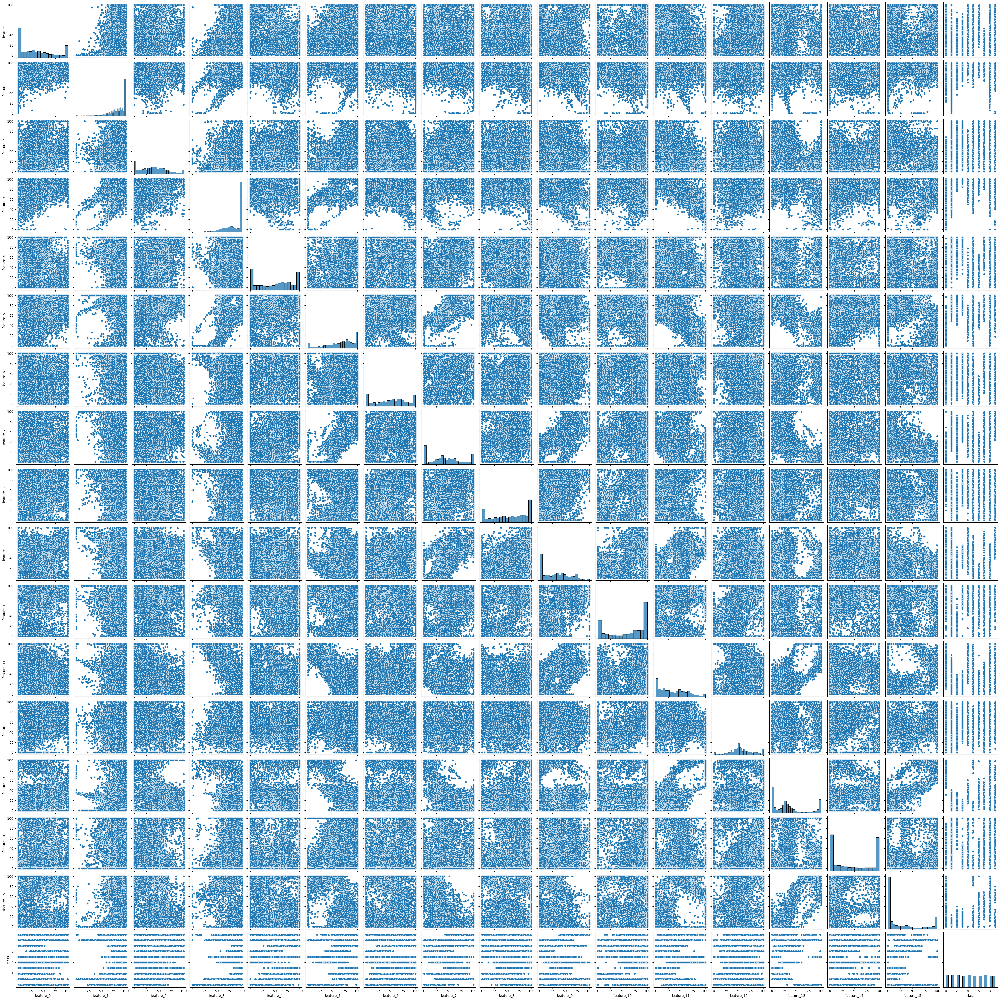

In [9]:
sns.pairplot(train_data)
plt.show()

A scatterplot matrix (pair plot) allows you to visualize the relationships between pairs of variables in your dataset. It helps to identify any linear or nonlinear relationships, clusters, or outliers in the data.

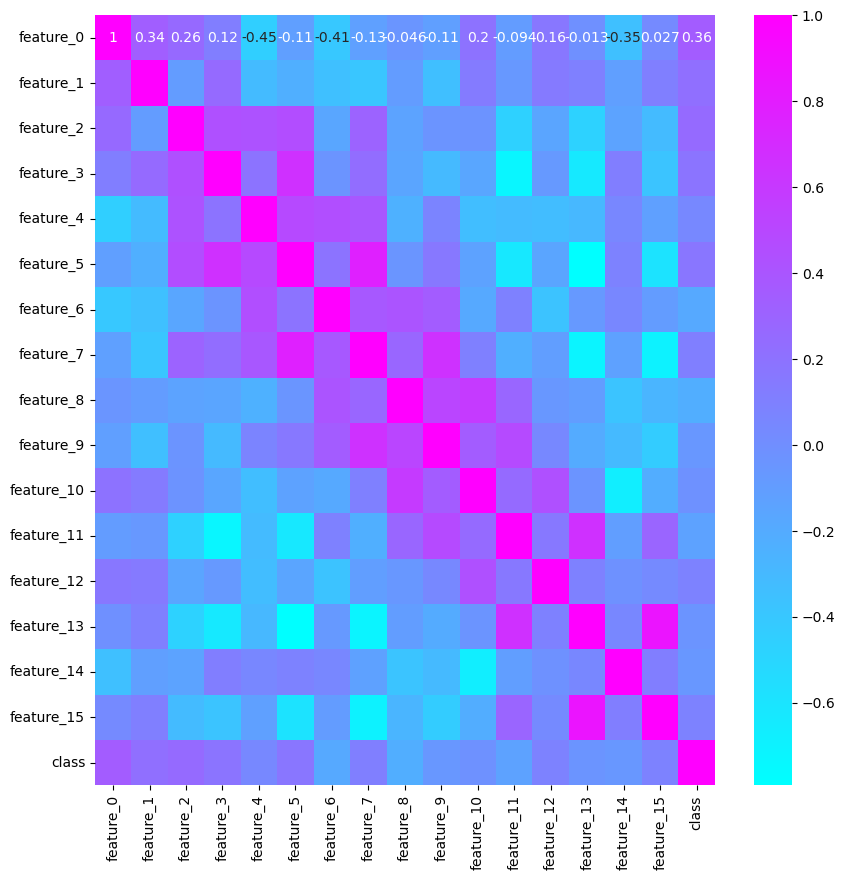

In [12]:
plt.figure(figsize=(10,10))
sns.heatmap(train_data.corr(), annot=True, cmap='cool')
plt.show()

A heatmap is a visual representation as we can see,showing how each variables is linearly related.
It uses colors to represent the magnitude of correlation.

# 2- Ensure data is in the correct format for downstream processes (e.g., remove redundant information, convert categorical to numerical values, address missing values, etc.)

In [15]:
train_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7493 entries, 0 to 7492
Data columns (total 17 columns):
 #   Column      Non-Null Count  Dtype
---  ------      --------------  -----
 0   feature_0   7493 non-null   int64
 1   feature_1   7493 non-null   int64
 2   feature_2   7493 non-null   int64
 3   feature_3   7493 non-null   int64
 4   feature_4   7493 non-null   int64
 5   feature_5   7493 non-null   int64
 6   feature_6   7493 non-null   int64
 7   feature_7   7493 non-null   int64
 8   feature_8   7493 non-null   int64
 9   feature_9   7493 non-null   int64
 10  feature_10  7493 non-null   int64
 11  feature_11  7493 non-null   int64
 12  feature_12  7493 non-null   int64
 13  feature_13  7493 non-null   int64
 14  feature_14  7493 non-null   int64
 15  feature_15  7493 non-null   int64
 16  class       7493 non-null   int64
dtypes: int64(17)
memory usage: 995.3 KB


In [16]:
test_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3497 entries, 0 to 3496
Data columns (total 17 columns):
 #   Column      Non-Null Count  Dtype
---  ------      --------------  -----
 0   feature_0   3497 non-null   int64
 1   feature_1   3497 non-null   int64
 2   feature_2   3497 non-null   int64
 3   feature_3   3497 non-null   int64
 4   feature_4   3497 non-null   int64
 5   feature_5   3497 non-null   int64
 6   feature_6   3497 non-null   int64
 7   feature_7   3497 non-null   int64
 8   feature_8   3497 non-null   int64
 9   feature_9   3497 non-null   int64
 10  feature_10  3497 non-null   int64
 11  feature_11  3497 non-null   int64
 12  feature_12  3497 non-null   int64
 13  feature_13  3497 non-null   int64
 14  feature_14  3497 non-null   int64
 15  feature_15  3497 non-null   int64
 16  class       3497 non-null   int64
dtypes: int64(17)
memory usage: 464.6 KB


In [17]:
#check any missing values ---> no missing values
train_data.isnull().sum()

feature_0     0
feature_1     0
feature_2     0
feature_3     0
feature_4     0
feature_5     0
feature_6     0
feature_7     0
feature_8     0
feature_9     0
feature_10    0
feature_11    0
feature_12    0
feature_13    0
feature_14    0
feature_15    0
class         0
dtype: int64

In [18]:
#check any missing values ---> no missing values
test_data.isnull().sum()

feature_0     0
feature_1     0
feature_2     0
feature_3     0
feature_4     0
feature_5     0
feature_6     0
feature_7     0
feature_8     0
feature_9     0
feature_10    0
feature_11    0
feature_12    0
feature_13    0
feature_14    0
feature_15    0
class         0
dtype: int64

In [19]:
#check any duplicated values ---> no duplicates
train_data.duplicated().sum()

0

In [20]:
#check any duplicated values ---> no duplicates
test_data.duplicated().sum()

0

In [21]:
train_data.max()

feature_0     100
feature_1     100
feature_2     100
feature_3     100
feature_4     100
feature_5     100
feature_6     100
feature_7     100
feature_8     100
feature_9     100
feature_10    100
feature_11    100
feature_12    100
feature_13    100
feature_14    100
feature_15    100
class           9
dtype: int64

In [22]:
train_data.min()

feature_0     0
feature_1     0
feature_2     0
feature_3     0
feature_4     0
feature_5     0
feature_6     0
feature_7     0
feature_8     0
feature_9     0
feature_10    0
feature_11    0
feature_12    0
feature_13    0
feature_14    0
feature_15    0
class         0
dtype: int64

In [23]:
test_data.max()

feature_0     100
feature_1     100
feature_2     100
feature_3     100
feature_4     100
feature_5     100
feature_6     100
feature_7     100
feature_8     100
feature_9     100
feature_10    100
feature_11    100
feature_12    100
feature_13    100
feature_14    100
feature_15    100
class           9
dtype: int64

In [24]:
test_data.min()

feature_0     0
feature_1     0
feature_2     0
feature_3     0
feature_4     0
feature_5     0
feature_6     0
feature_7     0
feature_8     0
feature_9     0
feature_10    0
feature_11    0
feature_12    0
feature_13    0
feature_14    0
feature_15    0
class         0
dtype: int64

In [25]:
#NO NEED FOR Scaling

In [26]:
#NO NEED TO Convert Categorical to Numerical Values or Addressing as all columns arte numerical

# 3- Fit a decision tree to the training data. Plot the tree, and display accuracy and Confusion Matrix.

In [28]:
import numpy as np
from sklearn.tree import DecisionTreeClassifier, plot_tree
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

decision_tree = DecisionTreeClassifier(random_state=42)

decision_tree.fit(x_train, y_train)

y_pred = decision_tree.predict(x_test)

# Evaluate the model
DecisionTree_accuracy = accuracy_score(y_test, y_pred)
conf_matrix = confusion_matrix(y_test, y_pred)
class_report = classification_report(y_test, y_pred)

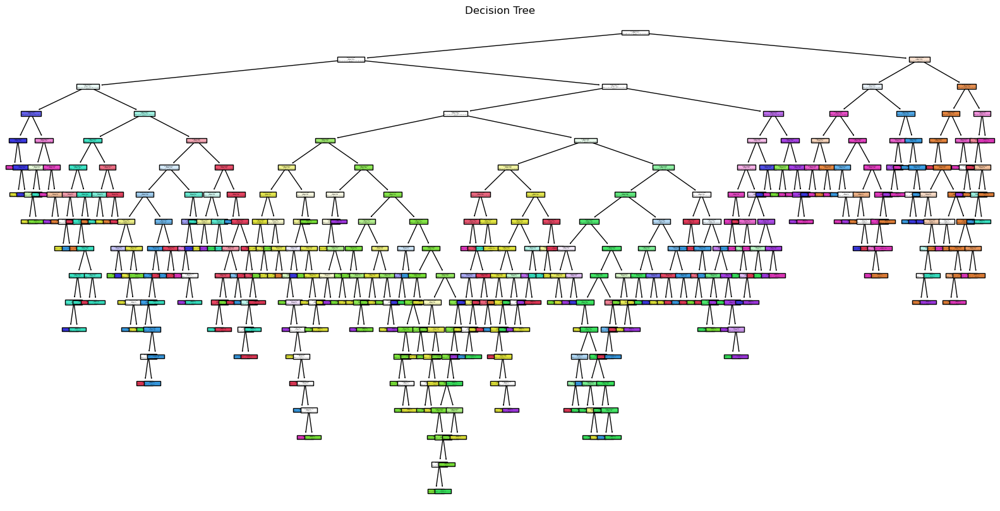

In [29]:
# Plot the decision tree ---> i searched for this :) 
plt.figure(figsize=(20,10))
plot_tree(decision_tree, filled=True, feature_names=[f"Feature {i}" for i in range(x_train.shape[1])], class_names=[str(i) for i in np.unique(y_train)])
plt.title("Decision Tree")
plt.show()

In [30]:
DecisionTree_accuracy

0.9176436945953674

In [31]:
print(conf_matrix)

[[350   0   0   0   0   0   1   1  11   0]
 [  0 315  45   1   1   1   0   1   0   0]
 [  0   9 350   0   0   2   1   2   0   0]
 [  1  12   2 313   0   3   0   0   0   5]
 [  0   0   0   2 353   2   4   1   0   2]
 [  0   3   1  26   7 280   0   1   4  13]
 [  9   5   1   0   0   0 318   0   3   0]
 [  0  14   4   8  24   0   1 311   2   0]
 [  3   0   0   0   2   3   2  18 307   0]
 [  0   6   0   3   4   2   0   6   3 312]]


In [32]:
print(class_report)

              precision    recall  f1-score   support

           0       0.96      0.96      0.96       363
           1       0.87      0.87      0.87       364
           2       0.87      0.96      0.91       364
           3       0.89      0.93      0.91       336
           4       0.90      0.97      0.94       364
           5       0.96      0.84      0.89       335
           6       0.97      0.95      0.96       336
           7       0.91      0.85      0.88       364
           8       0.93      0.92      0.92       335
           9       0.94      0.93      0.93       336

    accuracy                           0.92      3497
   macro avg       0.92      0.92      0.92      3497
weighted avg       0.92      0.92      0.92      3497



# 4- Try different ways to improve the decision tree algorithm (e.g., use different splitting strategies, prune tree after splitting). Does pruning the tree improves the accuracy?

In [34]:
from sklearn.model_selection import cross_val_score

In [35]:
path = decision_tree.cost_complexity_pruning_path(x_train, y_train) # i searched for this :) 
ccp_alphas = path.ccp_alphas[:-1] 
impurities = path.impurities[:-1]

In [36]:
train_scores = []
test_scores = []

for ccp_alpha in ccp_alphas:
    clf = DecisionTreeClassifier(random_state=42, ccp_alpha=ccp_alpha)
    clf.fit(x_train, y_train)
    
    train_scores.append(clf.score(x_train, y_train))
    test_scores.append(clf.score(x_test, y_test))

# Find the optimal alpha that gives the highest test accuracy
optimal_alpha = ccp_alphas[np.argmax(test_scores)]

# Train the final pruned decision tree using the optimal alpha
pruned_tree = DecisionTreeClassifier(random_state=42, ccp_alpha=optimal_alpha)
pruned_tree.fit(x_train, y_train)

pruned_pred = pruned_tree.predict(x_test)


Pruned_accuracy = accuracy_score(y_test, pruned_pred)
pruned_conf_matrix = confusion_matrix(y_test, pruned_pred)
class_report = classification_report(y_test, pruned_pred)

In [37]:
optimal_alpha

0.00012915280067848263

In [38]:
Pruned_accuracy

0.9179296539891335

In [39]:
print(pruned_conf_matrix)

[[350   0   0   0   0   0   1   1  11   0]
 [  0 316  45   1   1   0   0   1   0   0]
 [  0   9 350   0   0   2   1   2   0   0]
 [  1  12   2 313   0   3   0   0   0   5]
 [  0   0   0   2 353   2   4   1   0   2]
 [  0   3   1  26   7 280   0   1   4  13]
 [  9   5   1   0   0   0 318   0   3   0]
 [  0  14   4   8  24   0   1 311   2   0]
 [  3   1   0   0   2   2   2  18 307   0]
 [  0   6   0   3   4   2   0   6   3 312]]


In [40]:
print(class_report)

              precision    recall  f1-score   support

           0       0.96      0.96      0.96       363
           1       0.86      0.87      0.87       364
           2       0.87      0.96      0.91       364
           3       0.89      0.93      0.91       336
           4       0.90      0.97      0.94       364
           5       0.96      0.84      0.89       335
           6       0.97      0.95      0.96       336
           7       0.91      0.85      0.88       364
           8       0.93      0.92      0.92       335
           9       0.94      0.93      0.93       336

    accuracy                           0.92      3497
   macro avg       0.92      0.92      0.92      3497
weighted avg       0.92      0.92      0.92      3497



In [41]:
#there's a very small change, unnoticeable change in accuracy

Bagging

# 1- Apply bagging strategy to classify test set samples by using SVM algorithm as base estimator. Display accuracy and Confusion Matrix.

In [44]:
#svc model parameters
from sklearn.model_selection import GridSearchCV

params = {
    'kernel' : ['linear', 'poly', 'rbf'],
    'C' :[0.1, 0.01, 1],
    'gamma' : [0.1, 0.01, 1]
}

In [45]:
#grid search model
model = SVC()
gs_model = GridSearchCV(model, params)

In [46]:
gs_model.fit(x_train,y_train)

GridSearchCV(estimator=SVC(),
             param_grid={'C': [0.1, 0.01, 1], 'gamma': [0.1, 0.01, 1],
                         'kernel': ['linear', 'poly', 'rbf']})

In [47]:
gs_model.best_estimator_

SVC(C=0.1, gamma=0.1, kernel='poly')

In [48]:
from sklearn.ensemble import BaggingClassifier
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

# use the best estimator we got :) 
base_svm = SVC(kernel='poly', gamma=0.1, C=1.0, random_state=42)

bagging_svm = BaggingClassifier(base_estimator=base_svm, n_estimators=50, random_state=42)

bagging_svm.fit(x_train, y_train)

y_pred_bagging = bagging_svm.predict(x_test)

# Evaluate the model
SVM_accuracy= accuracy_score(y_test, y_pred_bagging)
baggingsvm_conf_matrix = confusion_matrix(y_test, y_pred_bagging)
class_report = classification_report(y_test, y_pred_bagging)

In [49]:
SVM_accuracy

0.9794109236488419

In [50]:
print(baggingsvm_conf_matrix)

[[349   0   0   0   0   0   0   0  14   0]
 [  0 360   1   0   1   0   0   2   0   0]
 [  0   1 363   0   0   0   0   0   0   0]
 [  0   1   0 332   0   0   0   1   0   2]
 [  0   1   0   0 359   4   0   0   0   0]
 [  0   0   0   4   0 329   0   0   1   1]
 [  0   0   0   0   0   0 336   0   0   0]
 [  0  12   4   6   0   0   1 337   0   4]
 [  1   0   0   0   0   1   0   0 333   0]
 [  0   1   0   0   0   4   0   3   1 327]]


In [51]:
print(class_report)

              precision    recall  f1-score   support

           0       1.00      0.96      0.98       363
           1       0.96      0.99      0.97       364
           2       0.99      1.00      0.99       364
           3       0.97      0.99      0.98       336
           4       1.00      0.99      0.99       364
           5       0.97      0.98      0.98       335
           6       1.00      1.00      1.00       336
           7       0.98      0.93      0.95       364
           8       0.95      0.99      0.97       335
           9       0.98      0.97      0.98       336

    accuracy                           0.98      3497
   macro avg       0.98      0.98      0.98      3497
weighted avg       0.98      0.98      0.98      3497



# 2- Apply Random Forest algorithm (the baseline), then fine tune this baseline. For the number of estimators, Try 5 different values within the interval of [10, 200]. Plot accuracy vs. number of estimators.

In [53]:
#Using Random Forest Classifier To Improve Accuracy
rf_model = RandomForestClassifier()
rf_model.fit(x_train, y_train)
y_pred = rf_model.predict(x_test)

RandomForest_accuracy = accuracy_score(y_test ,y_pred)
rf_conf_matrix = confusion_matrix(y_test, y_pred)
class_report = classification_report(y_test, y_pred)

In [54]:
RandomForest_accuracy

0.9671146697169002

In [55]:
print(rf_conf_matrix)

[[348   0   0   0   0   0   0   0  15   0]
 [  0 333  28   1   1   0   0   1   0   0]
 [  0   6 358   0   0   0   0   0   0   0]
 [  0   3   0 331   0   0   0   0   0   2]
 [  0   0   0   0 363   0   0   0   0   1]
 [  0   0   0   8   0 318   0   0   0   9]
 [  1   1   0   0   0   0 334   0   0   0]
 [  0  19   2   0   0   0   1 334   0   8]
 [  2   0   0   0   0   0   0   0 333   0]
 [  0   2   0   1   0   0   0   2   1 330]]


In [56]:
print(class_report)

              precision    recall  f1-score   support

           0       0.99      0.96      0.97       363
           1       0.91      0.91      0.91       364
           2       0.92      0.98      0.95       364
           3       0.97      0.99      0.98       336
           4       1.00      1.00      1.00       364
           5       1.00      0.95      0.97       335
           6       1.00      0.99      1.00       336
           7       0.99      0.92      0.95       364
           8       0.95      0.99      0.97       335
           9       0.94      0.98      0.96       336

    accuracy                           0.97      3497
   macro avg       0.97      0.97      0.97      3497
weighted avg       0.97      0.97      0.97      3497



# tune this baseline. For the number of estimators, Try 5 different values within the interval of [10, 200]

In [245]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV

rf = RandomForestClassifier(random_state=42)

# Define the parameter grid
param_grid = {
    'n_estimators': [50, 100, 150, 200],              # Number of trees
    'max_depth': [None, 10, 20, 30],                 # Maximum depth of the tree
    'min_samples_split': [2, 5, 10],                 # Minimum number of samples required to split a node
    'min_samples_leaf': [1, 2, 4],                   # Minimum number of samples required at a leaf node
    'max_features': ['auto', 'sqrt', 'log2'],        # Number of features to consider for the best split
    'bootstrap': [True, False]                       # Whether bootstrap samples are used
}

# Set up the grid search with cross-validation
grid_search = GridSearchCV(estimator=rf, param_grid=param_grid, cv=5, scoring='accuracy', n_jobs=-1, verbose=2)

# Fit the grid search to the data
grid_search.fit(x_train, y_train)

# Output the best parameters and the best score
best_params = grid_search.best_params_
best_score = grid_search.best_score_

print(f"Best Parameters: {best_params}")
print(f"Best Cross-Validation Accuracy: {best_score:.4f}")

# Use the best model for predictions
best_rf_model = grid_search.best_estimator_

Fitting 5 folds for each of 864 candidates, totalling 4320 fits
Best Parameters: {'bootstrap': False, 'max_depth': None, 'max_features': 'auto', 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 100}
Best Cross-Validation Accuracy: 0.9929


In [295]:
#Using the 5 parameters i searched for to improve accuracy :) 
rf_model = RandomForestClassifier(n_estimators=100,max_depth=None,max_features = 'auto',min_samples_leaf=1 ,min_samples_split=2,bootstrap=False, random_state=42)
rf_model.fit(x_train, y_train)
y_pred = rf_model.predict(x_test)

RandomForestWithNEstimators_accuracy = accuracy_score(y_test ,y_pred)
randomforestN_conf_matrix = confusion_matrix(y_test, y_pred)
class_report = classification_report(y_test, y_pred)

In [297]:
RandomForestWithNEstimators_accuracy

0.9679725478981984

In [299]:
print(randomforestN_conf_matrix)

[[347   0   0   0   0   0   0   0  16   0]
 [  0 339  23   0   1   0   0   1   0   0]
 [  0   4 359   0   0   0   0   1   0   0]
 [  0   3   0 332   0   0   0   0   0   1]
 [  0   0   0   0 363   1   0   0   0   0]
 [  0   0   0   7   0 314   0   0   3  11]
 [  1   0   0   0   0   0 335   0   0   0]
 [  0  13   3   0   0   0   0 331   0  17]
 [  0   0   0   0   0   0   0   0 335   0]
 [  0   2   0   1   0   0   0   2   1 330]]


In [301]:
print(class_report)

              precision    recall  f1-score   support

           0       1.00      0.96      0.98       363
           1       0.94      0.93      0.94       364
           2       0.93      0.99      0.96       364
           3       0.98      0.99      0.98       336
           4       1.00      1.00      1.00       364
           5       1.00      0.94      0.97       335
           6       1.00      1.00      1.00       336
           7       0.99      0.91      0.95       364
           8       0.94      1.00      0.97       335
           9       0.92      0.98      0.95       336

    accuracy                           0.97      3497
   macro avg       0.97      0.97      0.97      3497
weighted avg       0.97      0.97      0.97      3497



In [303]:
# Plot accuracy vs. number of estimators

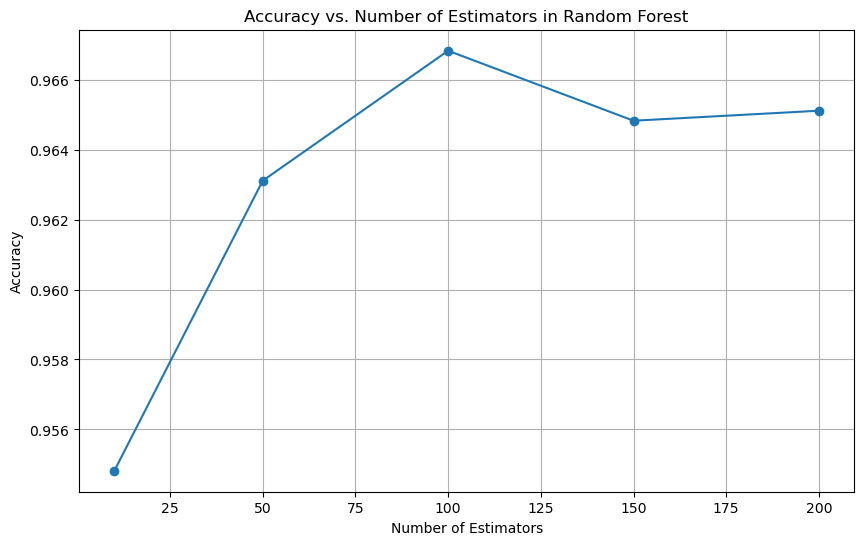

In [64]:
plt.figure(figsize=(10, 6))
plt.plot(n_estimators_list, accuracies, marker='o')
plt.title('Accuracy vs. Number of Estimators in Random Forest')
plt.xlabel('Number of Estimators')
plt.ylabel('Accuracy')
plt.grid(True)
plt.show()

Boosting

# 1- Use AdaBoost classifier. There are 2 important hyperparameters in AdaBoost,(the number of estimators, and learning rate). First, tune number of estimators parameter by trying 4 values in the interval of [10,200]. Then by using the tuned value for number of estmators, tune the learning rate parameter by trying 4 values within the range of [0.1, 0.9]. Display accuracy and Confusion Matrix separately for the best value of both parameters (Number of estimators and learning rate).


In [67]:
from sklearn.model_selection import GridSearchCV

# Step 1: Tune the Number of Estimators
n_estimators = [10, 50, 100, 150, 200]
train_accuracies = []
test_accuracies = []

# Loop over the number of estimators and train an AdaBoost classifier for each, recording the scores ---> i searched for this :) 
for n in n_estimators:
    ada_clf = AdaBoostClassifier(n_estimators=n, random_state=42)
    ada_clf.fit(x_train, y_train)
    
    train_accuracies.append(ada_clf.score(x_train, y_train))
    test_accuracies.append(ada_clf.score(x_test, y_test))
    
# Find the optimal number of estimators 
optimal_n_estimators = n_estimators[np.argmax(test_accuracies)]
print("Best Number of Estimators:", optimal_n_estimators)

Best Number of Estimators: 50


In [68]:
# Update AdaBoost classifier with best n_estimators
adaboost = AdaBoostClassifier(n_estimators=10, random_state=42)

In [69]:
# Step 2: Tune the Learning Rate
param_grid_learning_rate = {
    'learning_rate': [0.1, 0.3, 0.6, 0.9]
}

grid_search_learning_rate = GridSearchCV(adaboost, param_grid_learning_rate)

grid_search_learning_rate.fit(x_train, y_train)

# Fine the best learning_rate from tuning
best_learning_rate = grid_search_learning_rate.best_params_['learning_rate']
print("Best Learning Rate:", best_learning_rate)

Best Learning Rate: 0.3


In [70]:
best_adaboost = AdaBoostClassifier(n_estimators=50,learning_rate = 0.3, random_state=42)
best_adaboost.fit(x_train, y_train)

# Predict on the test set
y_pred = best_adaboost.predict(x_test)

# Evaluate the model
AdaBoost_accuracy = accuracy_score(y_test, y_pred)
ada_conf_matrix = confusion_matrix(y_test, y_pred)
class_report = classification_report(y_test, y_pred)

In [71]:
AdaBoost_accuracy

0.7063197026022305

In [72]:
print(ada_conf_matrix)

[[212   0   0   0   1   4 104   0  34   8]
 [  0 221 106   5   0   5   0   3   0  24]
 [  0  65 296   2   0   0   0   1   0   0]
 [  0   2   0 332   0   0   0   1   0   1]
 [  0   2   0   0 348   0   0   0   0  14]
 [  0   0   0  82   0  55   0   9 159  30]
 [  0   9   0   0   1   2 323   0   1   0]
 [  0  10  17   5   0   0   1 302   0  29]
 [ 83   0   0   0   0   1  41  26 184   0]
 [  0  34   0  86   0  17   0   1   1 197]]


In [73]:
print(class_report)

              precision    recall  f1-score   support

           0       0.72      0.58      0.64       363
           1       0.64      0.61      0.63       364
           2       0.71      0.81      0.76       364
           3       0.65      0.99      0.78       336
           4       0.99      0.96      0.97       364
           5       0.65      0.16      0.26       335
           6       0.69      0.96      0.80       336
           7       0.88      0.83      0.85       364
           8       0.49      0.55      0.52       335
           9       0.65      0.59      0.62       336

    accuracy                           0.71      3497
   macro avg       0.71      0.70      0.68      3497
weighted avg       0.71      0.71      0.69      3497



# 2- Build XGBoost classifier with the same parameters that you obtained in the last one,Provide accuracy and Confusion Matrix.


In [75]:
from xgboost import XGBClassifier

final_xgb_clf = XGBClassifier(n_estimators=50, learning_rate=0.3, random_state=42)
final_xgb_clf.fit(x_train, y_train)

xgb_test_predictions = final_xgb_clf.predict(x_test)

# Calculate accuracy
XGB_accuracy = accuracy_score(y_test, xgb_test_predictions)
xgb_conf_matrix = confusion_matrix(y_test, xgb_test_predictions)
class_report = classification_report(y_test, xgb_test_predictions)

In [76]:
XGB_accuracy

0.9628252788104089

In [77]:
print(xgb_conf_matrix)

[[343   0   0   0   0   0   0   0  20   0]
 [  0 340  22   0   0   0   0   2   0   0]
 [  0   2 361   0   0   0   0   1   0   0]
 [  0   3   0 331   0   0   0   1   0   1]
 [  0   1   0   0 361   1   0   1   0   0]
 [  0   1   0   5   0 319   1   0   2   7]
 [  0   1   2   0   0   2 331   0   0   0]
 [  0  21   4   1  12   0   0 326   0   0]
 [  2   0   0   0   0   0   0   0 333   0]
 [  0   5   0   7   0   0   0   1   1 322]]


In [78]:
print(class_report)

              precision    recall  f1-score   support

           0       0.99      0.94      0.97       363
           1       0.91      0.93      0.92       364
           2       0.93      0.99      0.96       364
           3       0.96      0.99      0.97       336
           4       0.97      0.99      0.98       364
           5       0.99      0.95      0.97       335
           6       1.00      0.99      0.99       336
           7       0.98      0.90      0.94       364
           8       0.94      0.99      0.96       335
           9       0.98      0.96      0.97       336

    accuracy                           0.96      3497
   macro avg       0.96      0.96      0.96      3497
weighted avg       0.96      0.96      0.96      3497



In [305]:
def models_accuracies(model_names, test_scores):
    summary_df = pd.DataFrame({
        'Model': model_names,
        'Test Score': test_scores
    })
    
    summary_df = summary_df.sort_values(by='Test Score', ascending=False).reset_index(drop=True)
    
    return summary_df

model_names = ['DecisionTree_Accuracy', 'Pruned_Accuracy', 'SVM-Bagging_Accuracy', 'RandomForest_With_N_Wstimators_Accuracy', 'RandomForest_Accuracy', 'AdaBoost_Accuracy', 'XGB_accuracy']
test_scores = [DecisionTree_accuracy, Pruned_accuracy, SVM_accuracy,RandomForestWithNEstimators_accuracy, RandomForest_accuracy, AdaBoost_accuracy, XGB_accuracy]

In [307]:
summary_df = models_accuracies(model_names, test_scores)
print(summary_df)

                                     Model  Test Score
0                     SVM-Bagging_Accuracy    0.979411
1  RandomForest_With_N_Wstimators_Accuracy    0.967973
2                    RandomForest_Accuracy    0.967115
3                             XGB_accuracy    0.962825
4                          Pruned_Accuracy    0.917930
5                    DecisionTree_Accuracy    0.917644
6                        AdaBoost_Accuracy    0.706320


In [310]:
models = {
    'SVC' : SVC(),
    'RandomForest_With_N_Estimators' : RandomForestClassifier(n_estimators=100, random_state=42),
    'RandomForestClassifier' : RandomForestClassifier(),
    'XGBClassifier' : XGBClassifier(),
    'PrunedClassifier' : DecisionTreeClassifier(random_state=42, ccp_alpha=0.00012915280067848263) ,
    'DecisionTreeClassifier': DecisionTreeClassifier(),
    'AdaBoostClassifier' : AdaBoostClassifier(n_estimators=50,learning_rate = 0.3, random_state=42),
}

def evaluate_model(actual, pred):
    report = classification_report(actual, pred)
    score = accuracy_score(actual, pred)
    return report, score

In [312]:
models_list = []
test_scores = []
train_scores = []
for i in range(len(list(models))):
    model = list(models.values())[i]
    #model ---> fit
    model.fit(x_train, y_train)
    #predict
    test_pred = model.predict(x_test) #test prediction
    train_pred = model.predict(x_train) #train prediction
    
    #model evaluation
    test_report, test_score = evaluate_model(y_test, test_pred)
    train_report, train_score = evaluate_model(y_train, train_pred)
    
    print(list(models.keys())[i])
    models_list.append(list(models.keys())[i])
    
    print('Model Training Performance : ')
    print("train_score = ", train_score)
    print('Train Classification Report : ')
    print(train_report)
    
    print('Model Testing Performance : ')
    print("Test Score = ", test_score)
    print('Test Classification Report : ')

    print(test_report)
    test_scores.append(test_score)
    train_scores.append(train_score)

SVC
Model Training Performance : 
train_score =  0.9966635526491392
Train Classification Report : 
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       780
           1       1.00      0.99      0.99       779
           2       0.99      1.00      0.99       780
           3       0.99      0.99      0.99       719
           4       1.00      1.00      1.00       780
           5       1.00      0.99      1.00       720
           6       1.00      1.00      1.00       720
           7       0.99      1.00      1.00       778
           8       1.00      1.00      1.00       718
           9       1.00      1.00      1.00       719

    accuracy                           1.00      7493
   macro avg       1.00      1.00      1.00      7493
weighted avg       1.00      1.00      1.00      7493

Model Testing Performance : 
Test Score =  0.9816985987989706
Test Classification Report : 
              precision    recall  f1-score   supp

In [313]:
for i in range(len(list(models))):
    model = list(models.values())[i]
    # Fit the model
    model.fit(x_train, y_train)
    # Predict on the train set
    train_pred = model.predict(x_train)
    
    # Evaluate model on the train set
    _, train_score = evaluate_model(y_train, train_pred)
    
    # Print the model name and train accuracy
    print(f"{list(models.keys())[i]} - Train Accuracy: {train_score}")


SVC - Train Accuracy: 0.9966635526491392
RandomForest_With_N_Estimators - Train Accuracy: 1.0
RandomForestClassifier - Train Accuracy: 1.0
XGBClassifier - Train Accuracy: 1.0
PrunedClassifier - Train Accuracy: 0.9993327105298279
DecisionTreeClassifier - Train Accuracy: 1.0
AdaBoostClassifier - Train Accuracy: 0.7274789803816896


In [314]:
def models_percentage_accuracies(model_names, test_scores):
    summary_df = pd.DataFrame({
        'Model': model_names,
        'Accuracy Percentage': ([score * 100 for score in test_scores])

    })
    
    summary_df = summary_df.sort_values(by='Accuracy Percentage', ascending=False).reset_index(drop=True)
    
    return summary_df

model_names = ['DecisionTree_Accuracy', 'Pruned_Accuracy', 'SVM-Bagging_Accuracy', 'RandomForest_With_N_Wstimators_Accuracy', 'RandomForest_Accuracy', 'AdaBoost_Accuracy', 'XGB_accuracy']
accuracy_percentage = [DecisionTree_accuracy, Pruned_accuracy, SVM_accuracy,RandomForestWithNEstimators_accuracy, RandomForest_accuracy, AdaBoost_accuracy, XGB_accuracy]

In [315]:
summary_df = models_percentage_accuracies(model_names, accuracy_percentage)
print(summary_df)

                                     Model  Accuracy Percentage
0                     SVM-Bagging_Accuracy            97.941092
1  RandomForest_With_N_Wstimators_Accuracy            96.797255
2                    RandomForest_Accuracy            96.711467
3                             XGB_accuracy            96.282528
4                          Pruned_Accuracy            91.792965
5                    DecisionTree_Accuracy            91.764369
6                        AdaBoost_Accuracy            70.631970


Bagging is generally better for reducing variance and stabilizing high-variance models like decision trees. It works well when you want to parallelize training and improve model robustness without worrying too much about bias.

Boosting is more powerful when you need to reduce both bias and variance and are dealing with a model that can benefit from focusing on difficult cases. However, it requires careful tuning to avoid overfitting and can be computationally more expensive due to its sequential nature.